<!-- Use h1 for printing on A3 page -->

<h1 style='float:left; font-variant: small-caps;' align='left'>Morphological Priori Constrained Object Detection of Key Structures in Infant Fundus Image</h1>
<!--h2 style='float:left; font-variant: small-caps;' align='center'>Morphological Priori Constrained Object Detection of Key Structures in Infant Fundus Image</h2-->

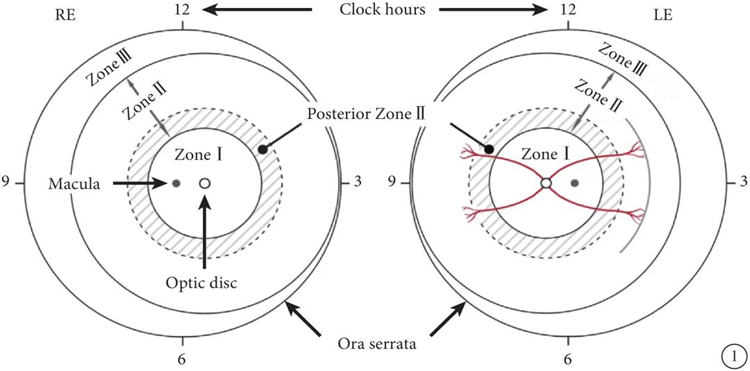

Zone 1 – Circle from centre of disc with radius of twice distance from disc to macula   
Zone 2 – From nasal edge of zone 1 to ora nasally and upto equatot region of retina temporally   
Posterior Zone II – ICROP3中继续保留了I区、II区和III区的定义，但细化了II区，提出了”后II区”的概念     
Zone 3 – From temporal crescent of retina anterior to zone II  
optic disc -  3 to 4 mm to the nasal side of the fovea. It is a vertical oval, with average dimensions of 1.76mm horizontally by 1.92mm vertically. There is a central depression, of variable size, called the optic cup.  
macula - has a diameter of around 5.5 mm (0.22 in). The fovea is located near the center of the macula. It is a small pit that contains the largest concentration of cone cells.

On a 512-pixel-high image, macula radius is 55, optic disk radius is 35. 

# Prepare the test.txt

This file contains all the image paths. We will use this file as input for the prediction process (test_frcnn.py)

In [24]:
import pandas as pd
from odn import utils

FILES = utils.get_all_images_in_dir('C:/Users/eleve/Desktop/横向2022/TO 分区/', '../data/fundus/test2.txt')
test_set = pd.read_csv('../data/fundus/test2.txt', header=None, encoding = 'gbk')
test_set

,0,1,2,3,4,5
0,C:/Users/eleve/Desktop/横向2022/TO 分区/注药/R24436-...,-1,-1,-1,-1,UNKNOWN
1,C:/Users/eleve/Desktop/横向2022/TO 分区/注药/R24436-...,-1,-1,-1,-1,UNKNOWN
2,C:/Users/eleve/Desktop/横向2022/TO 分区/注药/R24436-...,-1,-1,-1,-1,UNKNOWN
3,C:/Users/eleve/Desktop/横向2022/TO 分区/注药/R24436-...,-1,-1,-1,-1,UNKNOWN
4,C:/Users/eleve/Desktop/横向2022/TO 分区/注药/R24436-...,-1,-1,-1,-1,UNKNOWN
...,...,...,...,...,...,...
454,C:/Users/eleve/Desktop/横向2022/TO 分区/激光/R27401-...,-1,-1,-1,-1,UNKNOWN
455,C:/Users/eleve/Desktop/横向2022/TO 分区/激光/R27401-...,-1,-1,-1,-1,UNKNOWN
456,C:/Users/eleve/Desktop/横向2022/TO 分区/激光/R27401-...,-1,-1,-1,-1,UNKNOWN
457,C:/Users/eleve/Desktop/横向2022/TO 分区/激光/R27401-...,-1,-1,-1,-1,UNKNOWN



# Prediction

Predict on a new fudnus image set.

```
cd to odn/frcnn, run:

python test_frcnn.py --network vgg16 -p ../../data/fundus/test_public.txt --load models/vgg16/19e.hdf5 --num_rois 32 --write 
```
--num_rois: Number of ROIs per iteration. Higher means more memory use. Works like batch_size
--write: output annotated images to outputs


A `candidate_rois.txt` with all candidate ROIs is generated.

In [28]:
print('The generated candidate ROIs: ')
pd.read_csv('../src/odn/test2.txt_candidate_rois.txt', header=None)

The generated candidate ROIs: 


,0,1,2,3,4,5,6,7,8,9
0,seq,filename,class,prob,width,height,xmin,ymin,xmax,ymax
1,0,OD-c8ba5c91-1ada-416f-8b4f-9b6c655eb19b.15.jpg,OpticDisk,0.9968867897987366,1600,1200,288,448,448,640
2,1,OD-c8ba5c91-1ada-416f-8b4f-9b6c655eb19b.15.jpg,Macula,0.9853706359863281,1600,1200,640,480,896,736
3,2,OD-c8ba5c91-1ada-416f-8b4f-9b6c655eb19b.16.jpg,OpticDisk,0.9629062414169312,1600,1200,32,384,192,576
4,3,OD-c8ba5c91-1ada-416f-8b4f-9b6c655eb19b.26.jpg,OpticDisk,0.9684659242630005,1600,1200,672,0,864,160
...,...,...,...,...,...,...,...,...,...,...
594,593,OD-d0b87c01-1325-4d7a-8c62-6eed370ff4ff.jpg,OpticDisk,0.9985576272010803,1440,1080,662,374,806,489
595,594,OD-298cb3fc-e166-45fb-8c2e-bc8df11e031f.jpg,Macula,0.882879376411438,1440,1080,316,287,547,518
596,595,OD-3adb551f-dad0-4090-b3de-a73ec55ceb7c.jpg,Macula,0.850235104560852,1440,1080,633,0,863,230
597,596,OD-3adb551f-dad0-4090-b3de-a73ec55ceb7c.jpg,OpticDisk,0.9186745882034302,1440,1080,979,115,1151,287


# Filter Candidate ROIs by Priori Rules

In [1]:
from odn.fundus import annotation

annotation.rule_filter_rois(input_file = '../src/odn/test2.txt_candidate_rois.txt', 
    output_file = '../src/odn/test2.rois.txt',
    verbose = True)


-------- 
Input file: ../src/odn/test2.txt_candidate_rois.txt
   seq                                        filename      class      prob  \
0    0  OD-c8ba5c91-1ada-416f-8b4f-9b6c655eb19b.15.jpg  OpticDisk  0.996887   
1    1  OD-c8ba5c91-1ada-416f-8b4f-9b6c655eb19b.15.jpg     Macula  0.985371   
2    2  OD-c8ba5c91-1ada-416f-8b4f-9b6c655eb19b.16.jpg  OpticDisk  0.962906   
3    3  OD-c8ba5c91-1ada-416f-8b4f-9b6c655eb19b.26.jpg  OpticDisk  0.968466   
4    4  OD-e0bd0c66-7d49-4355-bdbc-c257e3cade53.35.jpg  OpticDisk  0.965487   

   width  height  xmin  ymin  xmax  ymax  
0   1600    1200   288   448   448   640  
1   1600    1200   640   480   896   736  
2   1600    1200    32   384   192   576  
3   1600    1200   672     0   864   160  
4   1600    1200    64   448   256   640  

-------- 
Indices of removed annos:  [460. 134. 317. 518. 519.  58.  60.  59. 177. 178. 147.  76.  77. 204.
 488. 489.  66.  67. 164. 325. 560. 562. 563. 455. 119. 158. 160. 495.
  89. 202. 180.  25. 480

,Unnamed: 0,seq,filename,class,prob,width,height,xmin,ymin,xmax,ymax
0,0,0,OD-c8ba5c91-1ada-416f-8b4f-9b6c655eb19b.15.jpg,OpticDisk,0.996887,1600,1200,288,448,448,640
1,1,1,OD-c8ba5c91-1ada-416f-8b4f-9b6c655eb19b.15.jpg,Macula,0.985371,1600,1200,640,480,896,736
2,2,2,OD-c8ba5c91-1ada-416f-8b4f-9b6c655eb19b.16.jpg,OpticDisk,0.962906,1600,1200,32,384,192,576
3,3,3,OD-c8ba5c91-1ada-416f-8b4f-9b6c655eb19b.26.jpg,OpticDisk,0.968466,1600,1200,672,0,864,160
4,4,4,OD-e0bd0c66-7d49-4355-bdbc-c257e3cade53.35.jpg,OpticDisk,0.965487,1600,1200,64,448,256,640
...,...,...,...,...,...,...,...,...,...,...,...
510,593,593,OD-d0b87c01-1325-4d7a-8c62-6eed370ff4ff.jpg,OpticDisk,0.998558,1440,1080,662,374,806,489
511,594,594,OD-298cb3fc-e166-45fb-8c2e-bc8df11e031f.jpg,Macula,0.882879,1440,1080,316,287,547,518
512,595,595,OD-3adb551f-dad0-4090-b3de-a73ec55ceb7c.jpg,Macula,0.850235,1440,1080,633,0,863,230
513,596,596,OD-3adb551f-dad0-4090-b3de-a73ec55ceb7c.jpg,OpticDisk,0.918675,1440,1080,979,115,1151,287


**The filtered ROIs are stored in rois.txt file**

# Render Images with ROIs

This exmaple uses inplace image generation, i.e., the output is in the same folder as original images.


----------- 
Content of  ../src/odn/test2.rois.txt
   Unnamed: 0  seq                                        filename      class  \
0           0    0  OD-c8ba5c91-1ada-416f-8b4f-9b6c655eb19b.15.jpg  OpticDisk   
1           1    1  OD-c8ba5c91-1ada-416f-8b4f-9b6c655eb19b.15.jpg     Macula   
2           2    2  OD-c8ba5c91-1ada-416f-8b4f-9b6c655eb19b.16.jpg  OpticDisk   
3           3    3  OD-c8ba5c91-1ada-416f-8b4f-9b6c655eb19b.26.jpg  OpticDisk   
4           4    4  OD-e0bd0c66-7d49-4355-bdbc-c257e3cade53.35.jpg  OpticDisk   

       prob  width  height  xmin  ymin  xmax  ymax  
0  0.996887   1600    1200   288   448   448   640  
1  0.985371   1600    1200   640   480   896   736  
2  0.962906   1600    1200    32   384   192   576  
3  0.968466   1600    1200   672     0   864   160  
4  0.965487   1600    1200    64   448   256   640  

----------- 
Unique image files:  369

----------- 
distribution of ROI labels:
OpticDisk    302
Macula       213
Name: class, dtype: int64


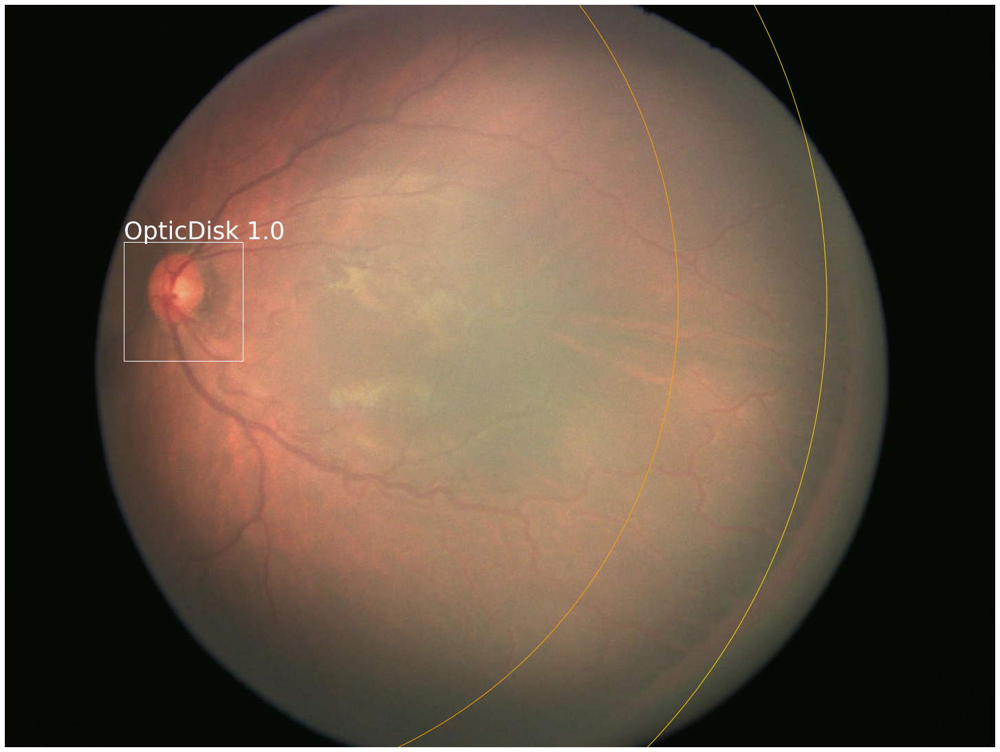

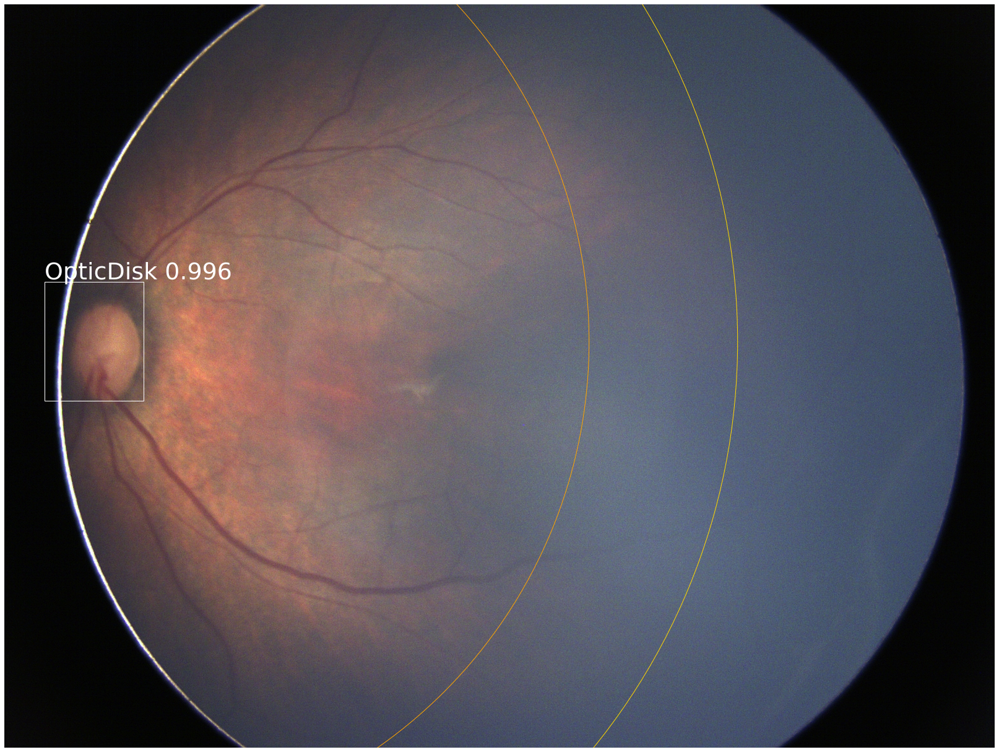

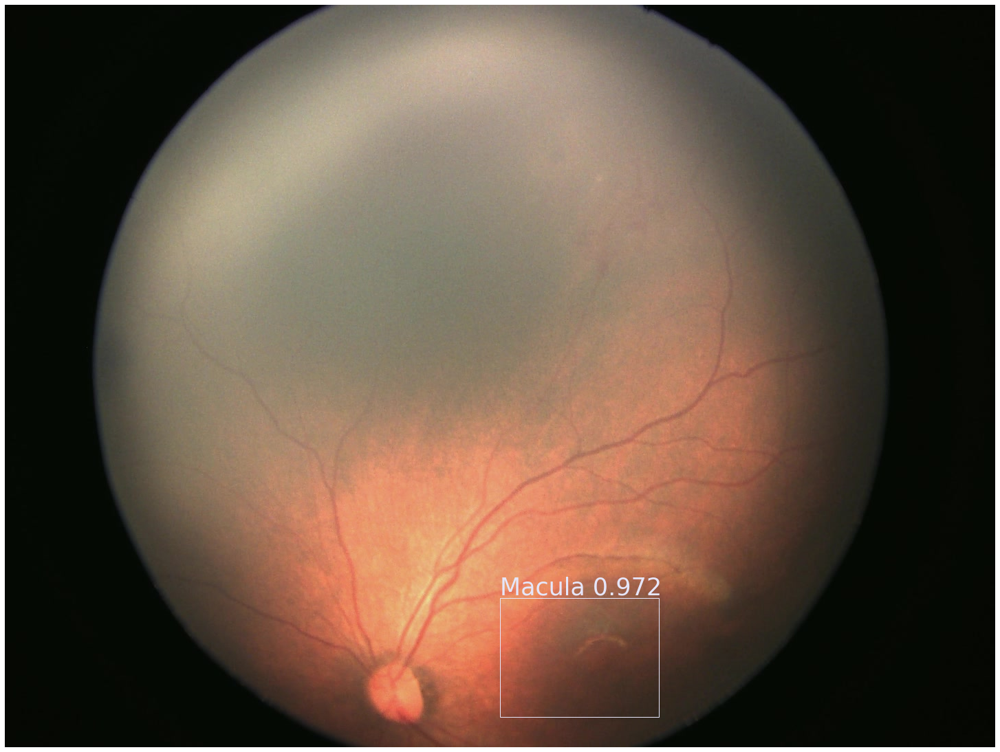

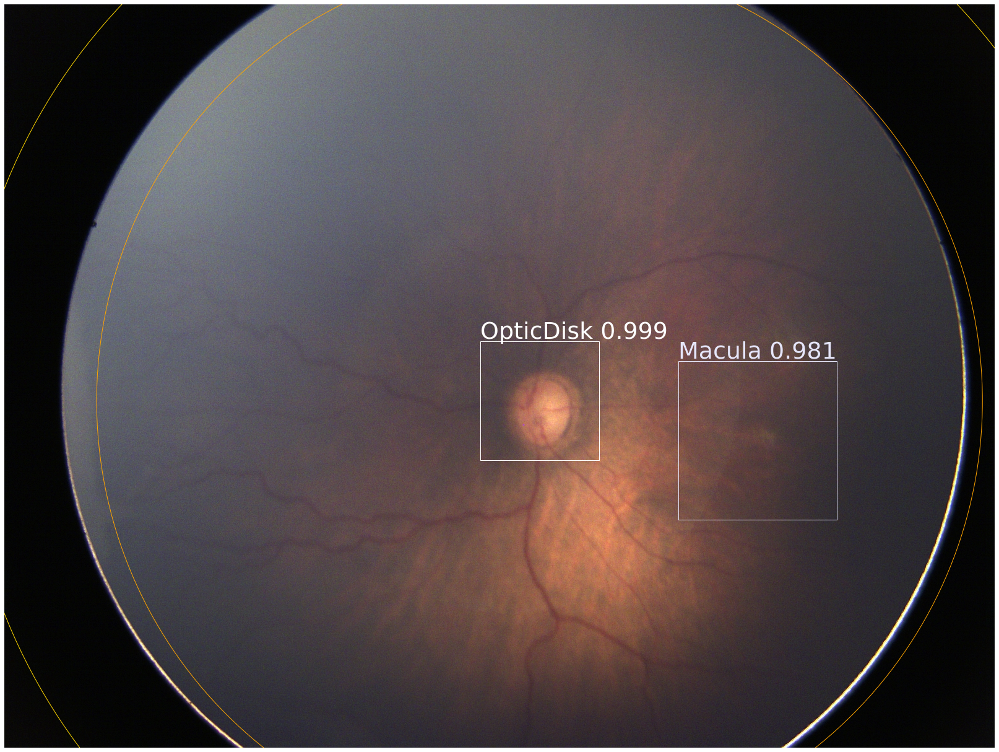

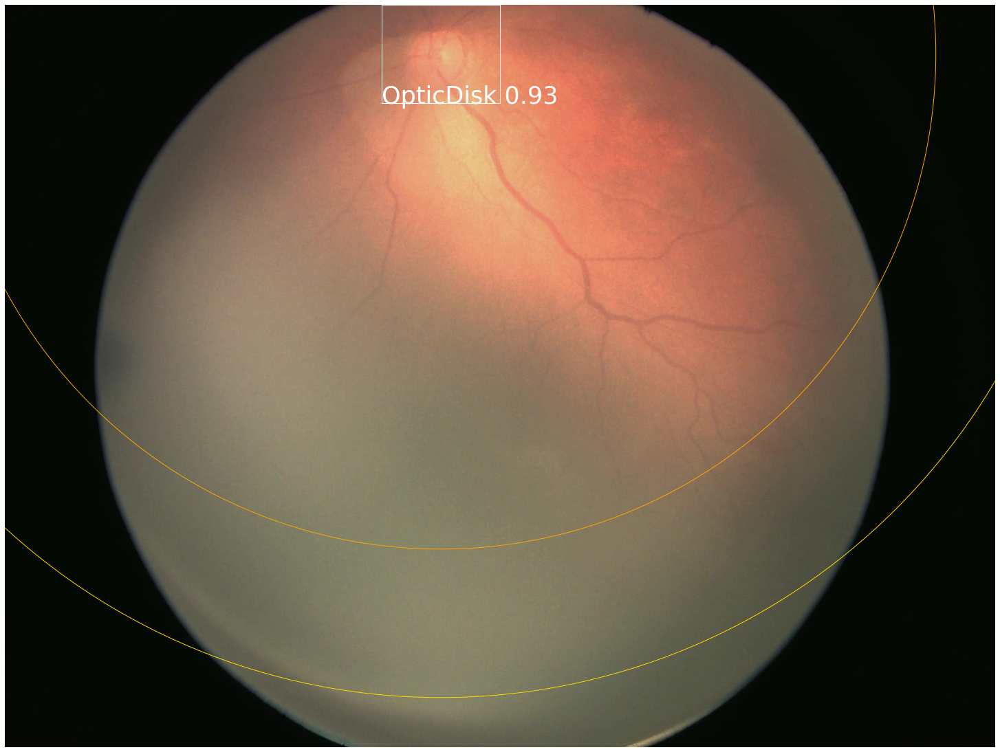

In [1]:
from odn.fundus import dataset
%matplotlib inline

dataset.synthesize_anno('../src/odn/test2.rois.txt', 
                        dir_images = 'C:/Users/eleve/Desktop/横向2022/TO 分区/', 
                        dir_output = 'inplace',
                        drawzones = True,
                        verbose = True,
                        suffix = '_FRCNN',
                        display = 5 )